<img src='../img/dust_banner.png' alt='Training school and workshop on dust' align='center' width='100%'></img>

<br>

# 05 - Practical exercise - Model II

### About

> Let us now return to the dust event in March 2022. As you recall, the dust outbreak lasted for a week from 15 to 22 March 2022 and extended across the Mediterranean Sea up as far as northern Europe. ([Source](https://www.eumetsat.int/widespread-dust-intrusion-across-europe))

> Today, you will focus on how you can use station observations from AERONET to evaluate model forecasts from CAMS global atmospheric composition forecast and from the SDS-WAS MONARCH model dust forecasts.
While model intercomparison is important, model outcomes also have to be compared with real-world observations. Just by comparing model outcomes with measurements from station data, we can better understand how the model performs.


### Tasks

#### 1. Brainstorm
  * What model datasets do you know about?
  * Which variables do they measure?
  * Which data can you use to evaluate model predictions?
  
#### 2. Download the dust forecast from the MONARCH model
  * Download the dust forecast from the MONARCH model for 15 March 2022
  * **Hint** 
    * [WMO SDS-WAS dust forecast - Example notebook](../04_data_workflows/43_model_data/434_SDS-WAS_MONARCH_dust_forecast.ipynb)
    * [Data access](https://dust.aemet.es/products/data-download)
      * User: `eumetsat-training`
      * Password: `Sod/e3Oi2+cK17Z/`
 
#### 3. Download the CAMS global atmopsheric composition forecast
  * Download the CAMS global atmospheric composition forecast for 15 March 2022, with the following specifications:
    > Variable on single levels: `Dust aerosol optical depth at 550 nm` <br>
    > Date (Start and end): `2022-03-15` <br>
    > Time: `12:00` <br>
    > Leadtime hour: every three hours from `0 to 90` <br>
    > Type: `Forecast` <br>
    > Restricted area: `N: 71, W: -22, E: 43, S: 28` <br>
    > Format: `Zipped netCDF` <br>
  * **Hint** 
    * [CAMS global atmospheric composition forecasts - Example notebook](../04_data_workflows/43_model_data/431_CAMS_global_forecast_duaod_load_browse.ipynb)
    * [Data access](https://ads.atmosphere.copernicus.eu/cdsapp#!/dataset/cams-global-atmospheric-composition-forecasts)

#### 4. Look up the coordinates of the AERONET station *Coruna, Spain*
  * **Hint**
    * You can see an overview of all available AERONET Site Names [here](https://aeronet.gsfc.nasa.gov/cgi-bin/draw_map_display_aod_v3?long1=-180&long2=180&lat1=-90&lat2=90&multiplier=2&what_map=4&nachal=1&formatter=0&level=3&place_code=10&place_limit=0)

#### 5. Select the time-series for CAMS global atmospheric composition forecasts for *Coruna, Spain*
  * **Hint**
    * With the xarray function `sel()` and keyword argument `method='nearest'` you can select data based on coordinate information
    * We also recommend you to transform your xarray.DataArray into a pandas.DataFrame with the function `to_dataframe()` and save it as `csv` with the function `to_csv()`

#### 6. Load the MONARCH dust forecasts and select time-series for *Coruna, Spain*
  * **Hint**
    * With the xarray function `sel()` and keyword argument `method='nearest'` you can select data based on coordinate information
    * We also recommend you to transform your xarray.DataArray into a pandas.DataFrame with the function `to_dataframe()` and save it as `csv` with the function `to_csv()`

#### 7. Download and plot time-series of AERONET data for *Coruna, Spain*
  * Download and visualise AERONET v3.0 measurements for all points of the station *Coruna, Spain* for 15 to 22 March 2022.
  * The data type we will download and plot today is `SDA20`. This contains the coarse mode AOD which indicates the presence of dust.
  * **Some questions to reflect on**
    * Under which name is the station listed in AERONET?
    * What average level would you choose?
    * Which days do we have observations for?
  * **Hint** 
    * [AERONET observations - Example notebook](../04_data_workflows/42_groundbased_observations/421_AERONET.ipynb)

#### 8. Resample AERONET data to a 3-hourly resolution
  * Make use of AERONET `index` and `time` columns to create a `DateTimeIndex` in order to resample the observations to a 3-hourly temporal resolution
  * **Hint**
    * you have to combine the two columns `index` and `time` as one string variable
    * you can use the pandas function `to_datetime()` to create a `DateTimeIndex` and the function `resample().mean()` to resample and average the time-series to a given temporal resolution 
  * **Question to reflect on**
    * How many row entries does the resampled data frame have?

#### 9. Load time-series of the forecasts from CAMS and the MONARCH model 

#### 10. Plot both model forecasts with the AERONET observations

#### 11. Interpret the plotting result.
  * Can you make a statement about the performance of the two forecast models?
  * What are your conclusions regarding AERONET observation data?
  * Compare these results with the SEVIRI Dust RGB [online](https://sds-was.aemet.es/forecast-products/dust-observations/msg-2013-eumetsat) and the MODIS Natural Colour RGB [online](https://go.nasa.gov/3WTHjOW). Why is it a good idea to use model, ground-based and satellite observations together?

### Module outline
* [1 - Download the dust forecast from the MONARCH model](#download_sds_was)
* [2 - Download the CAMS global atmopsheric composition forecast](#download_cams_forecast)
* [3 - Select latitude / longitude values for AERONET station Coruna, Spain](#select_lat_lon)
* [4 - Select time-series for CAMS global atmospheric composition forecasts](#ts_cams)
* [5 - Load the MONARCH dust forecasts and select time-series](#sdswas_forecast_load)
* [6 - Download and plot time-series of AERONET data](#download_aeronet)
* [7 - Resample AERONET data to a 3-hourly resolution](#resample_aeronet)
* [8 - Load time series of forecasts from CAMS and the MONARCH model](#model_timeseries)
* [9 - Plot both model forecasts with the AERONET observations](#compare_model_observations)


<hr>

##### Load required libraries

In [7]:
import wget
import pandas as pd

import matplotlib.pyplot as pl
import matplotlib.colors
from matplotlib.cm import get_cmap
from matplotlib import animation
from matplotlib.axes import Axes

import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import cartopy.feature as cfeature
from cartopy.mpl.geoaxes import GeoAxes
GeoAxes._pcolormesh_patched = Axes.pcolormesh

import warnings
warnings.simplefilter(action = "ignore", category = RuntimeWarning)

##### Load helper functions

In [8]:
%run ../functions.ipynb

<hr>

### <a id='download_sds_was'></a>1. Download the dust forecasts from the MONARCH model

In [10]:
usr = 'eumetsat-training'
pwd = 'Sod/e3Oi2+cK17Z/'
!wget --user = "eumetsat-training" --password = "Sod/e3Oi2+cK17Z/" "https://dust.aemet.es/thredds/fileServer/dataRoot/MONARCH/2022/03/2022031512_3H_SDSWAS_NMMB-BSC-v2_OPER.nc"

--2023-03-03 13:44:13--  http://eumetsat-training/
Resolving eumetsat-training (eumetsat-training)... failed: Name or service not known.
wget: unable to resolve host address ‘eumetsat-training’
--2023-03-03 13:44:13--  http://sod/e3Oi2+cK17Z/
Resolving sod (sod)... failed: Name or service not known.
wget: unable to resolve host address ‘sod’
--2023-03-03 13:44:13--  https://dust.aemet.es/thredds/fileServer/dataRoot/MONARCH/2022/03/2022031512_3H_SDSWAS_NMMB-BSC-v2_OPER.nc
Resolving dust.aemet.es (dust.aemet.es)... 212.128.97.132
Connecting to dust.aemet.es (dust.aemet.es)|212.128.97.132|:443... connected.
HTTP request sent, awaiting response... 401 
Authentication selected: Basic realm="THREDDS Data Server"
Reusing existing connection to dust.aemet.es:443.
HTTP request sent, awaiting response... 401 

Username/Password Authentication Failed.


<br>

### <a id='download_cams_forecast'></a>2. Download CAMS global atmospheric composition forecasts 

In [11]:
import cdsapi

url= 'https://ads.atmosphere.copernicus.eu/api/v2'
key= '12714:ce643f0d-6679-4f36-8c32-a8c225ffe63a'

c = cdsapi.Client(url=url, key=key)

c.retrieve(
    'cams-global-atmospheric-composition-forecasts',
    {
        'date': '2022-03-15/2022-03-15',
        'type': 'forecast',
        'format': 'netcdf_zip',
        'variable': 'dust_aerosol_optical_depth_550nm',
        'time': '12:00',
        'leadtime_hour': [
            '0', '12', '15',
            '18', '21', '24',
            '27', '3', '30',
            '33', '36', '39',
            '42', '45', '48',
            '51', '54', '57',
            '6', '60', '63',
            '66', '69', '72',
            '75', '78', '81',
            '84', '87', '9',
            '90',
        ],
        'area': [
            71, -22, 28,
            43,
        ],
    },
    './Data/Cams/CAMS_AOD_150322.netcdf_zip')

/opt/conda/lib/python3.8/site-packages/urllib3/connectionpool.py:1013: InsecureRequestWarning: Unverified HTTPS request is being made to host 'ads.atmosphere.copernicus.eu'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(
2023-03-03 13:53:22,461 INFO Welcome to the CDS
2023-03-03 13:53:22,462 INFO Sending request to https://ads.atmosphere.copernicus.eu/api/v2/resources/cams-global-atmospheric-composition-forecasts
/opt/conda/lib/python3.8/site-packages/urllib3/connectionpool.py:1013: InsecureRequestWarning: Unverified HTTPS request is being made to host 'ads.atmosphere.copernicus.eu'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(
2023-03-03 13:53:22,526 INFO Request is completed
2023-03-03 13:53:22,527 INFO Downloading https://download-0000-ads-clone.copernicus-climate.eu/cache-compute

Result(content_length=1093888,content_type=application/zip,location=https://download-0000-ads-clone.copernicus-climate.eu/cache-compute-0000/cache/data9/adaptor.mars_constrained.external-1675940155.6148684-27434-2-634b861d-dc05-45ae-a8c2-1a088de3a08d.zip)

In [12]:
import zipfile
with zipfile.ZipFile('./Data/Cams/CAMS_AOD_150322.netcdf_zip', 'r') as zip_ref:
    zip_ref.extractall('./Data/Cams/Forecast/')

<br>

### <a id='select_lat_lon'></a>3. Select latitude / longitude values for `Coruna`

You can see an overview of all available AERONET Site Names [here](https://aeronet.gsfc.nasa.gov/cgi-bin/draw_map_display_aod_v3?long1=-180&long2=180&lat1=-90&lat2=90&multiplier=2&what_map=4&nachal=1&formatter=0&level=3&place_code=10&place_limit=0).

In [13]:
cor_lat = 43.363
cor_lon = -8.421

<br>

### <a id='ts_cams'></a>4. Select time-series for CAMS global atmospheric composition forecasts

In [18]:
# Load data
AOD_CAMS = xr.open_dataset('./Data/Cams/CAMS_AOD_150322.nc')
AOD_CAMS_CO = AOD_CAMS.sel(longitude = cor_lon, latitude = cor_lat, method = 'nearest')
# Convert to df
df_AOD_CAMS_CO = AOD_CAMS_CO.to_dataframe()

<br>

### <a id='sdswas_forecast_load'></a>5. Load MONARCH dust forecasts and select time-series

<AxesSubplot:xlabel='time'>

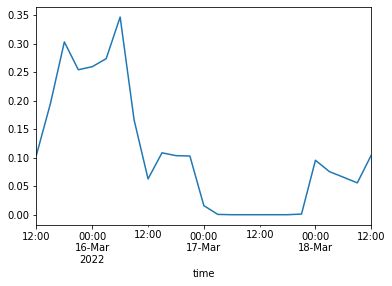

In [29]:
Monarch = xr.open_dataset('./Data/Monarch/2022031512_3H_SDSWAS_NMMB-BSC-v2_OPER.nc')
Mon_AOD = Monarch.od550_dust
Mon_AOD_CO = Mon_AOD.sel(lon = cor_lon, lat = cor_lat, method = 'nearest')
# Convert to df
df_AOD_Mon_CO = Mon_AOD_CO.to_dataframe()
df_AOD_Mon_CO['od550_dust'].plot()

<br>

### <a id='download_aeronet'></a>6. Download and plot time-series of AERONET data

In [33]:
# Create data dict to download the data
#AOD
data_dict = {
    'endpoint': 'https://aeronet.gsfc.nasa.gov/cgi-bin/print_web_data_v3',
    'station':'Coruna',
    'year': 2022,
    'month': 3,
    'day': 15,
    'year2': 2022,
    'month2': 3,
    'day2': 22,
    'AOD20': 1,
    'AVG': 10
}
url = '{endpoint}?site={station}&year={year}&month={month}&day={day}&year2={year2}&month2={month2}&day2={day2}&AOD20={AOD20}&AVG={AVG}'.format(**data_dict)
wget.download(url, './Data/Aeronet/202203_coruna_aod20_20.txt')

# SDA
data_dict = {
    'endpoint': 'https://aeronet.gsfc.nasa.gov/cgi-bin/print_web_data_v3',
    'station':'Coruna',
    'year': 2022,
    'month': 3,
    'day': 15,
    'year2': 2022,
    'month2': 3,
    'day2': 22,
    'SDA20': 1,
    'AVG': 10
}
url = '{endpoint}?site={station}&year={year}&month={month}&day={day}&year2={year2}&month2={month2}&day2={day2}&SDA20={SDA20}&AVG={AVG}'.format(**data_dict)
wget.download(url, './Data/Aeronet/202203_coruna_SDA20_20.txt')

'./Data/Aeronet/202203_coruna_SDA20_20.txt'

In [53]:
# Read data
df_aer_AOD = pd.read_table('./Data/Aeronet/202203_coruna_aod20_20.txt', delimiter=',', header=[7], index_col=1)
df_aer_SDA = pd.read_table('./Data/Aeronet/202203_coruna_SDA20_20.txt', delimiter=',', header=[7], index_col=1)
# Create datetimeindex
df_aer_AOD.index = pd.to_datetime(df_aer_AOD.index.str.replace(':','-')+' '++ df_aer_AOD['Time(hh:mm:ss)'], dayfirst = True)
df_aer_SDA.index = pd.to_datetime(df_aer_SDA.index.str.replace(':','-')+' '++ df_aer_SDA['Time_(hh:mm:ss)'], dayfirst = True)

In [36]:
# Create nans
df_aer_AOD = df_aer_AOD.replace(-999.0, np.nan)
df_aer_SDA = df_aer_SDA.replace(-999.0, np.nan)

In [62]:
df_aer_SDA['Coarse_Mode_AOD_500nm[tau_c]']

2022-03-15 07:51:40    0.200623
2022-03-15 07:57:45    0.187887
2022-03-15 08:05:07    0.201768
2022-03-15 08:14:34    0.225937
2022-03-15 08:21:44    0.227399
                         ...   
2022-03-21 10:27:06    0.140905
2022-03-21 10:42:07    0.124073
2022-03-21 10:48:14    0.123622
2022-03-21 10:57:07    0.118014
NaT                         NaN
Name: Coarse_Mode_AOD_500nm[tau_c], Length: 178, dtype: float64

In [37]:
#%% matplotlib parameters
matplotlib.rcParams['xtick.labelsize'] = 14
matplotlib.rcParams['ytick.labelsize'] = 14
matplotlib.rcParams['font.size'] = 16

Text(0, 0.5, 'Coarse AOD')

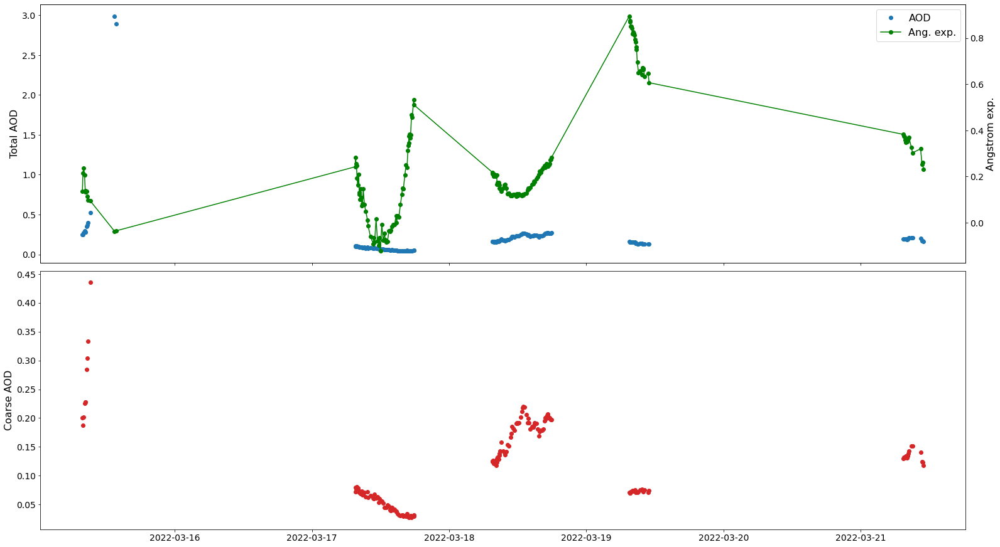

In [64]:
fig, axs = plt.subplots(figsize=(22,12),nrows=2,constrained_layout =True, sharex = True)

l1, = axs[0].plot(df_aer_AOD['AOD_500nm'],'o')
ax2 = axs[0].twinx()
l2, = ax2.plot(df_aer_AOD['500-870_Angstrom_Exponent'],'go-')
axs[0].set_ylabel('Total AOD')
ax2.set_ylabel('Angstrom exp.')
ax2.legend((l1,l2),('AOD','Ang. exp.'))

axs[1].plot(df_aer_SDA['Coarse_Mode_AOD_500nm[tau_c]'],'o',c='C3')
axs[1].set_ylabel('Coarse AOD')

<br>

### <a id='resample_aeronet'></a>7. Resample AERONET data to a 3-hourly resolution

In [65]:
df_aer_AOD_3h = df_aer_AOD.resample('3h').mean()
df_aer_SDA_3h = df_aer_SDA.resample('3h').mean()

<br>

### <a id='model_timeseries'></a>8. Load time series of the forecasts from CAMS and the MONARCH model

In [ ]:
# The relevant timeseries are df_AOD_Mon_CO['od550_dust'] and df_AOD_CAMS_CO['duaod550']

In [66]:
df_AOD_CAMS_CO.columns

Index(['longitude', 'latitude', 'duaod550'], dtype='object')

<br>

### <a id='compare_model_observations'></a> 9. Plot both model forecasts with the AERONET observations

Before plotting, make sure to rename the column using the following code. You can replace `df_merged` with the name of your merged dataframe.

In [34]:
df_merged.rename({'Coarse_Mode_AOD_500nm[tau_c]': 'Coarse_Mode_AOD_500nm'}, axis=1, inplace=True)

Text(0, 0.5, 'Dust aerosol optical depth')

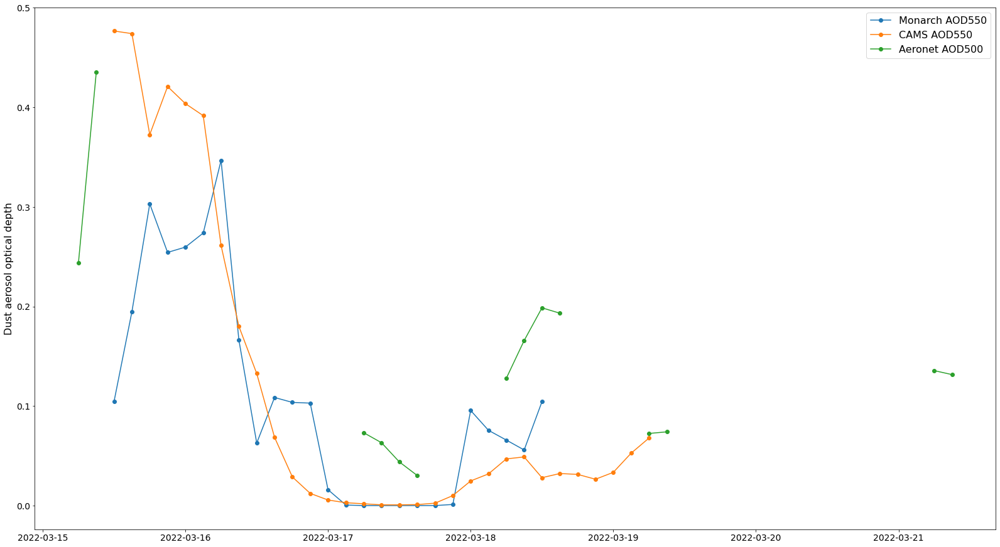

In [69]:
fig, axs = plt.subplots(figsize=(22,12),constrained_layout =True)
l1, = axs.plot(df_AOD_Mon_CO['od550_dust'],'o-')
l2, = axs.plot(df_AOD_CAMS_CO['duaod550'],'o-')
l3, = axs.plot(df_aer_SDA_3h['Coarse_Mode_AOD_500nm[tau_c]'],'o-')
axs.legend((l1,l2,l3),('Monarch AOD550','CAMS AOD550', 'Aeronet AOD500'))

axs.set_ylabel('Dust aerosol optical depth')

<br>

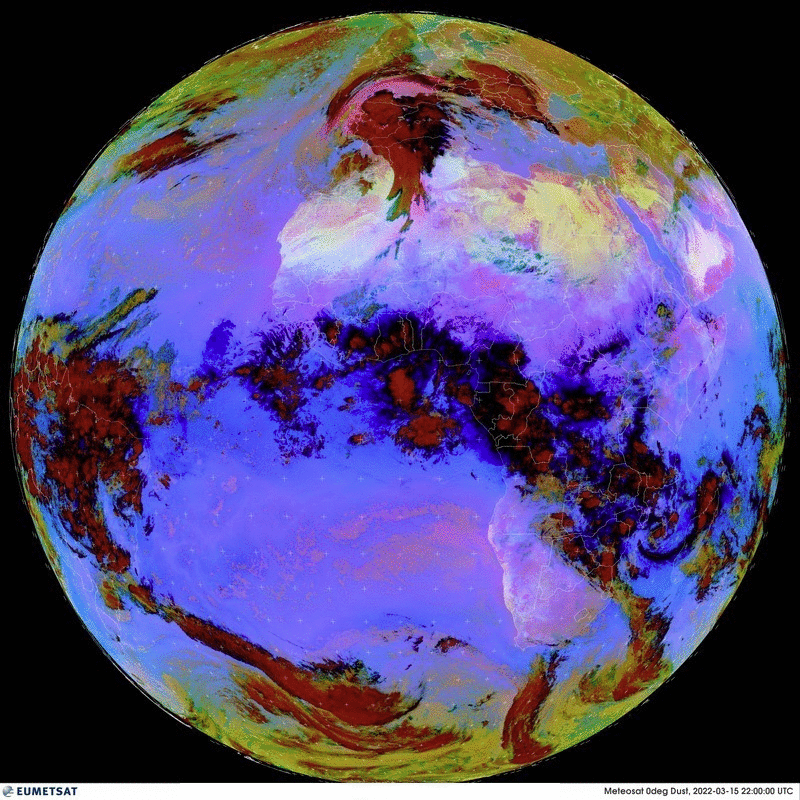!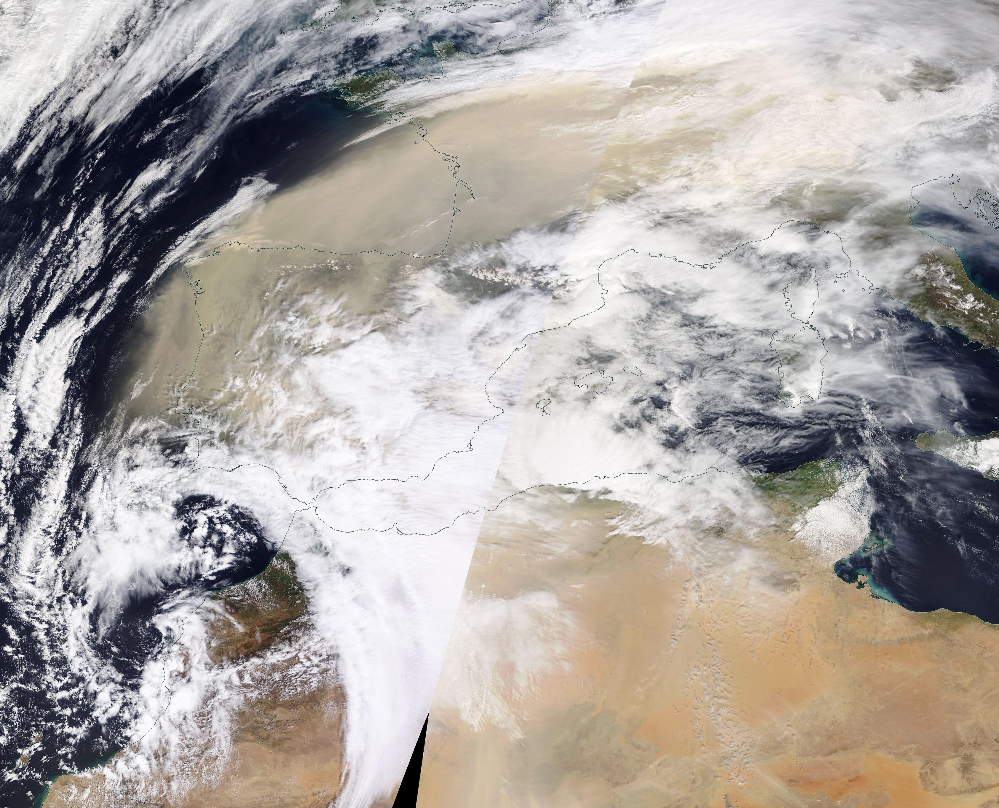!

<hr>

<img src='../img/copernicus_logo.png' alt='Logo EU Copernicus' align='left' width='20%'><br><br><br><br>
This project is licensed under <a href="../../LICENSE">GNU General Public License v3.0 only</a> and is developed under a Copernicus contract.

<p style="text-align:right;"> <a href='https://training.eumetsat.int'>EUMETSAT Training</a> | <a href='mailto:training@eumetsat.int'>Contact the training team</a></p>